<a href="https://colab.research.google.com/github/ricoprediansyah/CV-FASTER_RCNN-SAWIT-MAX_1000_LABEL_CROP/blob/main/FASTER_RCNN_SAWIT_MAX_1000_LABEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="PZMfN1gExhcqfGkkkd43")
project = rf.workspace("cryospace-yylkk").project("palm-tree-label-200m-splitted")
version = project.version(4)
dataset = version.download("voc")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Palm-Tree-Label-200m-Splitted-4 in voc:: 100%|██████████| 869/869 [00:01<00:00, 618.19it/s]


In [ ]:
# Membuat folder images dan annotations
!mkdir -p images annotations

In [ ]:
import os
import shutil

# Daftar folder sumber
folders = ['/content/Palm-Tree-Label-200m-Splitted-4/test', '/content/Palm-Tree-Label-200m-Splitted-4/train', '/content/Palm-Tree-Label-200m-Splitted-4/valid']

# Membuat folder tujuan jika belum ada
os.makedirs('/content/images', exist_ok=True)
os.makedirs('/content/annotations', exist_ok=True)

# Memindahkan file berdasarkan ekstensi
for folder in folders:
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)

        # Memindahkan file .xml ke /content/annotations
        if filename.endswith('.xml'):
            shutil.move(file_path, '/content/annotations/')

        # Memindahkan file .png, .jpg, atau .jpeg ke /content/images
        elif filename.endswith(('.png', '.jpg', '.jpeg')):
            shutil.move(file_path, '/content/images/')


In [ ]:
import os
import random
import numpy as np
import shutil

# Menghitung dan mencetak jumlah file di folder annotations dan images
print(f'Jumlah file di annotations: {len(os.listdir("annotations"))}')
print(f'Jumlah file di images: {len(os.listdir("images"))}')

# Membuat folder test_images dan test_annotations
os.makedirs('test_images', exist_ok=True)
os.makedirs('test_annotations', exist_ok=True)

# Mengatur seed untuk reproducibility
random.seed(1234)

# Menghitung jumlah dataset
total_data = 432
test_data_count = 80

# Mengambil indeks secara acak untuk 8 data
idx = random.sample(range(total_data), test_data_count)

# Memindahkan file gambar ke test_images
for img in np.array(sorted(os.listdir('images')))[idx]:
    shutil.move(os.path.join('images', img), os.path.join('test_images', img))

# Memindahkan file anotasi ke test_annotations
for annot in np.array(sorted(os.listdir('annotations')))[idx]:
    shutil.move(os.path.join('annotations', annot), os.path.join('test_annotations', annot))

# Menghitung dan mencetak jumlah file setelah pemindahan
print(f'Jumlah file di annotations setelah pemindahan: {len(os.listdir("annotations"))}')
print(f'Jumlah file di images setelah pemindahan: {len(os.listdir("images"))}')
print(f'Jumlah file di test_annotations: {len(os.listdir("test_annotations"))}')
print(f'Jumlah file di test_images: {len(os.listdir("test_images"))}')


Jumlah file di annotations: 432
Jumlah file di images: 432
Jumlah file di annotations setelah pemindahan: 352
Jumlah file di images setelah pemindahan: 352
Jumlah file di test_annotations: 80
Jumlah file di test_images: 80


In [ ]:
import os
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from PIL import Image
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import time

In [ ]:
def generate_box(obj):
    xmin = float(obj.find('xmin').text)
    ymin = float(obj.find('ymin').text)
    xmax = float(obj.find('xmax').text)
    ymax = float(obj.find('ymax').text)

    return [xmin, ymin, xmax, ymax]

In [ ]:
adjust_label = 0

def generate_label(obj):
    # Mengembalikan label 1 untuk class "Rico-Prediansyah"
    if obj.find('name').text == "Palm-Tree":
        return 1 + adjust_label

    # Jika class tidak dikenali, kembalikan 0
    return 0 + adjust_label

In [ ]:
def generate_target(file):
    with open(file) as f:
        data = f.read()
        soup = BeautifulSoup(data, "html.parser")
        objects = soup.find_all("object")

        num_objs = len(objects)

        boxes = []
        labels = []
        for i in objects:
            boxes.append(generate_box(i))
            labels.append(generate_label(i))

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        return target

In [ ]:
def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

        else :

            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
class MaskDataset(object):
    def __init__(self, transforms, path):
        '''
        path: path to train folder or test folder
        '''
        # define the path to the images and what transform will be used
        self.transforms = transforms
        self.path = path
        self.imgs = list(sorted(os.listdir(self.path)))


    def __getitem__(self, idx): #special method
        # load images ad masks
        file_image = self.imgs[idx]
        file_label = self.imgs[idx][:-3] + 'xml'
        img_path = os.path.join(self.path, file_image)

        if 'test' in self.path:
            label_path = os.path.join("test_annotations/", file_label)
        else:
            label_path = os.path.join("annotations/", file_label)

        img = Image.open(img_path).convert("RGB")
        #Generate Label
        target = generate_target(label_path)

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

data_transform = transforms.Compose([  # transforms.Compose : a class that calls the functions in a list consecutively
        transforms.ToTensor() # ToTensor : convert numpy image to torch.Tensor type
    ])

def collate_fn(batch):
    return tuple(zip(*batch))

dataset = MaskDataset(data_transform, 'images/')
test_dataset = MaskDataset(data_transform, 'test_images/')

data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, collate_fn=collate_fn)
test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=2, collate_fn=collate_fn)

In [ ]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_model_instance_segmentation(num_classes, max_detections=1000):  # Ubah dari 300 ke 1000
    # Pretrained Faster R-CNN with ResNet-50 backbone
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # Replace the head of the box predictor with custom number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Set the maximum number of detections per image (ubah default 100 ke max_detections)
    model.roi_heads.detections_per_img = max_detections

    return model

In [ ]:
# Instansiasi model dengan 2 kelas (Palm Tree + Background) dan set max 300 deteksi per gambar
model = get_model_instance_segmentation(2, max_detections=1000)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
torch.cuda.is_available()

True

In [ ]:
num_epochs = 40
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

In [ ]:
print('----------------------train start--------------------------')
for epoch in range(num_epochs):
    start = time.time()
    model.train()
    i = 0
    epoch_loss = 0
    for imgs, annotations in data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        epoch_loss += losses
    print(f'epoch : {epoch+1}, Loss : {epoch_loss}, time : {time.time() - start}')

----------------------train start--------------------------
epoch : 1, Loss : 45.310401916503906, time : 86.68176484107971
epoch : 2, Loss : 44.87453842163086, time : 85.08722281455994
epoch : 3, Loss : 44.175140380859375, time : 85.50070142745972
epoch : 4, Loss : 43.62061309814453, time : 85.52986121177673
epoch : 5, Loss : 43.09621047973633, time : 85.09078359603882
epoch : 6, Loss : 42.667877197265625, time : 84.6173734664917
epoch : 7, Loss : 42.62767028808594, time : 85.15560865402222
epoch : 8, Loss : 42.76008605957031, time : 85.59801387786865
epoch : 9, Loss : 41.356224060058594, time : 85.57620668411255
epoch : 10, Loss : 40.955718994140625, time : 85.23508143424988
epoch : 11, Loss : 40.7833251953125, time : 84.76224088668823
epoch : 12, Loss : 39.801658630371094, time : 85.42128992080688
epoch : 13, Loss : 39.66832733154297, time : 84.93935513496399
epoch : 14, Loss : 38.678688049316406, time : 85.3946304321289
epoch : 15, Loss : 38.291954040527344, time : 86.17838335037231

In [ ]:
torch.save(model.state_dict(),f'model_{num_epochs}.pt')

In [ ]:
model.load_state_dict(torch.load(f'model_{num_epochs}.pt'))

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


<All keys matched successfully>

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

In [ ]:
with torch.no_grad():
    # batch size of the test set = 2
    for imgs, annotations in test_data_loader:
        imgs = list(img.to(device) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        print(pred)
        break

[{'boxes': tensor([[8.7947e+00, 6.9924e+02, 1.6776e+02, 9.0732e+02],
        [8.9653e+02, 7.3473e+02, 1.0644e+03, 9.2495e+02],
        [4.0004e+02, 1.1991e+03, 5.6650e+02, 1.3767e+03],
        [3.0236e+01, 4.3393e+02, 1.6914e+02, 6.1777e+02],
        [1.4541e+03, 7.4111e+02, 1.6000e+03, 9.0318e+02],
        [1.2521e+03, 9.3393e+02, 1.4007e+03, 1.1257e+03],
        [8.0738e+02, 6.0292e+02, 9.9876e+02, 7.7748e+02],
        [1.6123e+03, 1.3219e+02, 1.7532e+03, 2.9721e+02],
        [1.2052e+02, 9.5746e+02, 2.8658e+02, 1.1259e+03],
        [1.7023e+02, 1.5565e+03, 3.3217e+02, 1.7530e+03],
        [1.9345e+02, 3.1399e+01, 3.8373e+02, 1.9423e+02],
        [1.6652e+02, 7.0017e+02, 3.1473e+02, 9.0083e+02],
        [1.3970e+03, 5.8747e+02, 1.5671e+03, 7.7759e+02],
        [1.0337e+03, 1.6356e+03, 1.1920e+03, 1.8157e+03],
        [1.4377e+03, 3.6426e+02, 1.5816e+03, 5.0027e+02],
        [3.5658e+01, 1.5486e+03, 1.8535e+02, 1.7033e+03],
        [7.4916e+02, 1.3717e+03, 9.1711e+02, 1.5068e+03],
   

Target :  tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1])


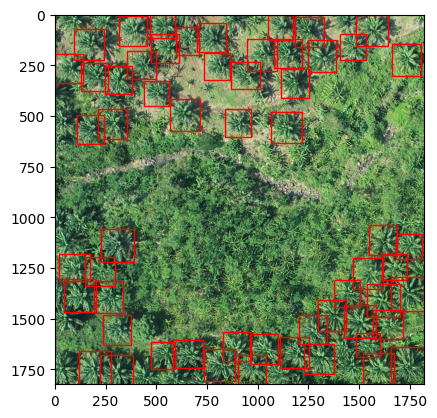

Prediction :  tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])


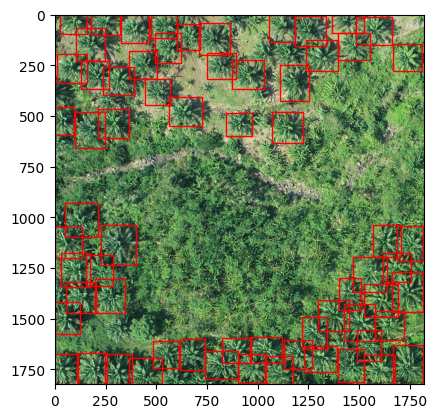

In [ ]:
#GPU

_idx = 1

# Pastikan tensor diubah menjadi numpy setelah dipindahkan ke CPU
print("Target : ", annotations[_idx]['labels'].cpu())  # Pindahkan labels ke CPU sebelum dicetak

# Pindahkan gambar ke CPU untuk visualisasi
imgs_cpu = imgs[_idx].cpu()

# Pindahkan setiap tensor di dalam annotations ke CPU
annotations_cpu = {k: v.cpu() for k, v in annotations[_idx].items()}

# Visualisasikan gambar dan anotasi (target)
plot_image_from_output(imgs_cpu, annotations_cpu)

# Pindahkan prediksi ke CPU
pred_cpu = {k: v.cpu() for k, v in pred[_idx].items()}

# Visualisasikan gambar dan prediksi
print("Prediction : ", pred_cpu['labels'])
plot_image_from_output(imgs_cpu, pred_cpu)

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


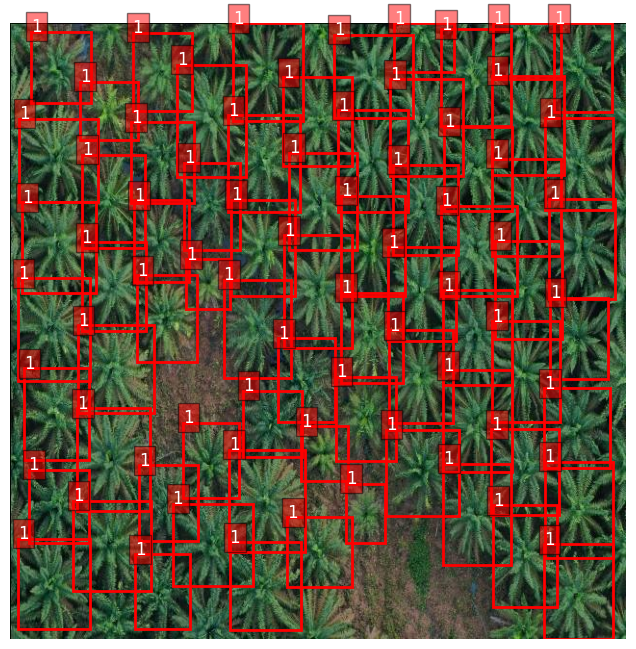

Jumlah kotak prediksi yang muncul: 69


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Memuat gambar baru
img_path = '/content/sawit.jpg'
image = Image.open(img_path).convert("RGB")
transform = transforms.ToTensor()
image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

# Melakukan prediksi
model.eval()
with torch.no_grad():
    pred = model(image_tensor)

# Menentukan threshold untuk prediksi
threshold = 0.1
pred_boxes = []
pred_labels = []

# Menyaring prediksi berdasarkan skor
for idx in range(len(pred)):
    for i, score in enumerate(pred[idx]['scores']):
        if score > threshold:
            pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
            pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

# Menampilkan gambar asli dengan kotak prediksi
plot_image_with_boxes(image, pred_boxes, pred_labels)

# Menghitung jumlah box (bounding boxes)
num_boxes = len(pred_boxes)
print(f"Jumlah kotak prediksi yang muncul: {num_boxes}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


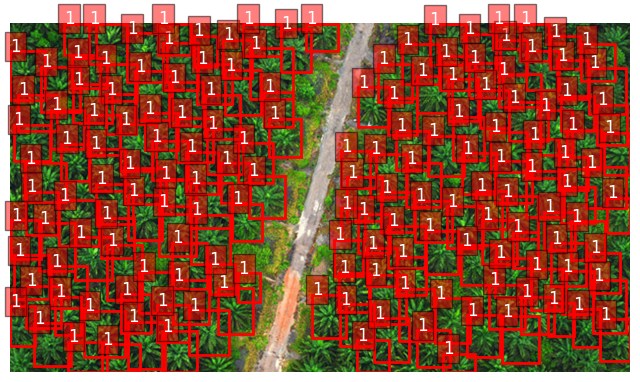

Jumlah kotak prediksi yang muncul: 157


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Memuat gambar baru
img_path = '/content/sawit6.jpg'
image = Image.open(img_path).convert("RGB")
transform = transforms.ToTensor()
image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

# Melakukan prediksi
model.eval()
with torch.no_grad():
    pred = model(image_tensor)

# Menentukan threshold untuk prediksi
threshold = 0.1
pred_boxes = []
pred_labels = []

# Menyaring prediksi berdasarkan skor
for idx in range(len(pred)):
    for i, score in enumerate(pred[idx]['scores']):
        if score > threshold:
            pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
            pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

# Menampilkan gambar asli dengan kotak prediksi
plot_image_with_boxes(image, pred_boxes, pred_labels)

# Menghitung jumlah box (bounding boxes)
num_boxes = len(pred_boxes)
print(f"Jumlah kotak prediksi yang muncul: {num_boxes}")

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


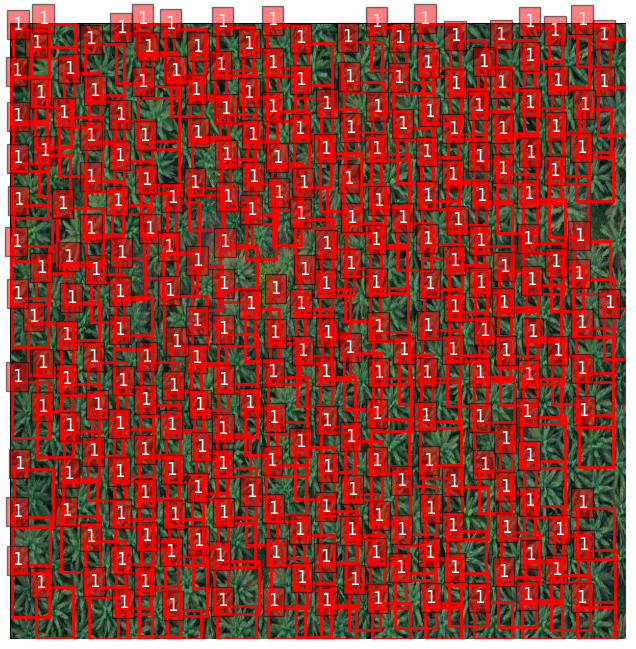

Jumlah kotak prediksi yang muncul: 261


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Memuat gambar baru
img_path = '/content/sawit2.jpg'
image = Image.open(img_path).convert("RGB")
transform = transforms.ToTensor()
image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

# Melakukan prediksi
model.eval()
with torch.no_grad():
    pred = model(image_tensor)

# Menentukan threshold untuk prediksi
threshold = 0.1
pred_boxes = []
pred_labels = []

# Menyaring prediksi berdasarkan skor
for idx in range(len(pred)):
    for i, score in enumerate(pred[idx]['scores']):
        if score > threshold:
            pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
            pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

# Menampilkan gambar asli dengan kotak prediksi
plot_image_with_boxes(image, pred_boxes, pred_labels)

# Menghitung jumlah box (bounding boxes)
num_boxes = len(pred_boxes)
print(f"Jumlah kotak prediksi yang muncul: {num_boxes}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


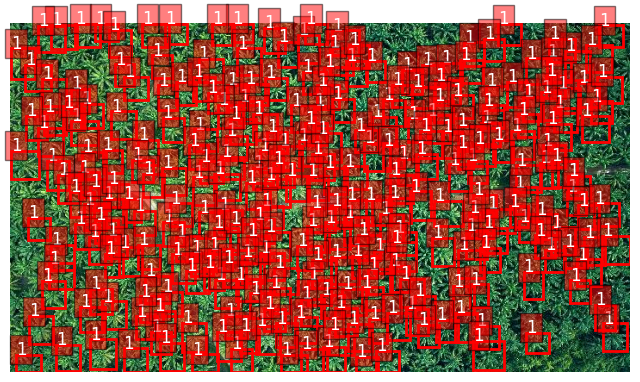

Jumlah kotak prediksi yang muncul: 281


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Memuat gambar baru
img_path = '/content/sawit3.jpg'
image = Image.open(img_path).convert("RGB")
transform = transforms.ToTensor()
image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

# Melakukan prediksi
model.eval()
with torch.no_grad():
    pred = model(image_tensor)

# Menentukan threshold untuk prediksi
threshold = 0.01
pred_boxes = []
pred_labels = []

# Menyaring prediksi berdasarkan skor
for idx in range(len(pred)):
    for i, score in enumerate(pred[idx]['scores']):
        if score > threshold:
            pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
            pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

# Menampilkan gambar asli dengan kotak prediksi
plot_image_with_boxes(image, pred_boxes, pred_labels)

# Menghitung jumlah box (bounding boxes)
num_boxes = len(pred_boxes)
print(f"Jumlah kotak prediksi yang muncul: {num_boxes}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


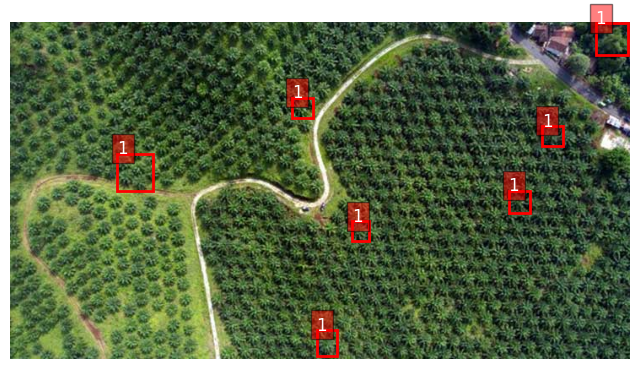

Jumlah kotak prediksi yang muncul: 7


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Memuat gambar baru
img_path = '/content/sawit5.jpg'
image = Image.open(img_path).convert("RGB")
transform = transforms.ToTensor()
image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

# Melakukan prediksi
model.eval()
with torch.no_grad():
    pred = model(image_tensor)

# Menentukan threshold untuk prediksi
threshold = 0.1
pred_boxes = []
pred_labels = []

# Menyaring prediksi berdasarkan skor
for idx in range(len(pred)):
    for i, score in enumerate(pred[idx]['scores']):
        if score > threshold:
            pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
            pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

# Menampilkan gambar asli dengan kotak prediksi
plot_image_with_boxes(image, pred_boxes, pred_labels)

# Menghitung jumlah box (bounding boxes)
num_boxes = len(pred_boxes)
print(f"Jumlah kotak prediksi yang muncul: {num_boxes}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


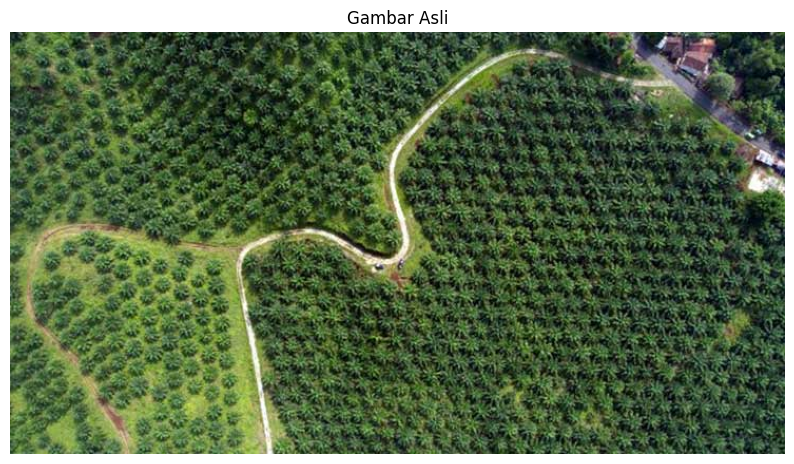

Prediksi untuk gambar crop ke-1:


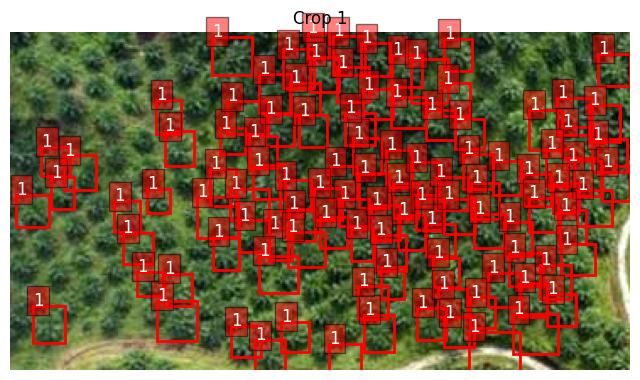

Jumlah label pada crop 1: 103
Prediksi untuk gambar crop ke-2:


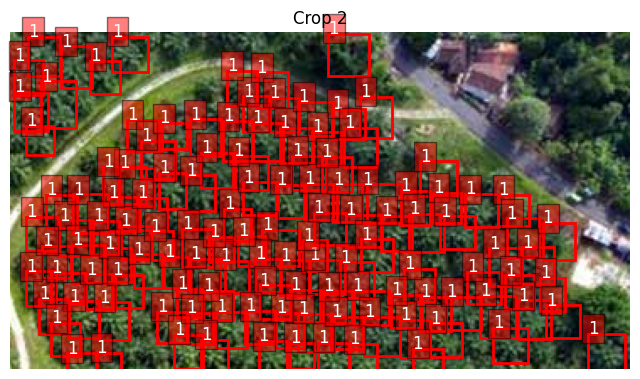

Jumlah label pada crop 2: 124
Prediksi untuk gambar crop ke-3:


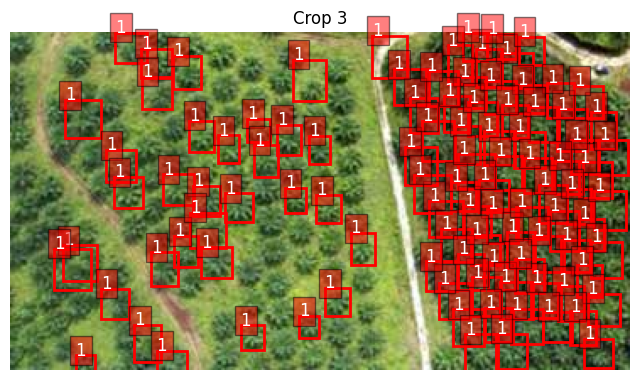

Jumlah label pada crop 3: 103
Prediksi untuk gambar crop ke-4:


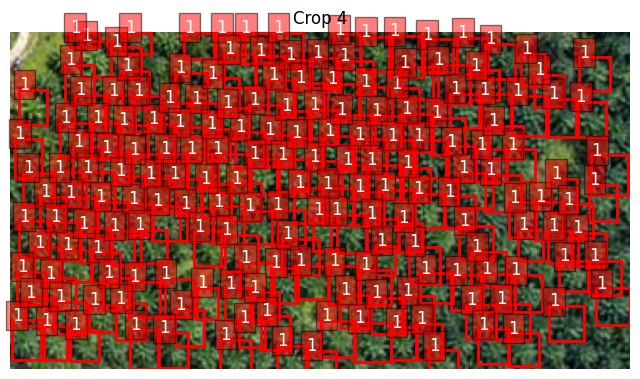

Jumlah label pada crop 4: 184
Jumlah total label dari keempat crop gambar: 514


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels, title="Predicted Image"):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.title(title)
    plt.axis('off')
    plt.show()

def predict_on_image(image, model, device, threshold=0.01):
    transform = transforms.ToTensor()
    image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

    # Melakukan prediksi
    model.eval()
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    pred_labels = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
                pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

    return pred_boxes, pred_labels

# Memuat gambar baru
img_path = '/content/sawit5.jpg'
image = Image.open(img_path).convert("RGB")

# Menampilkan gambar asli
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.title("Gambar Asli")
plt.axis('off')
plt.show()

# Mendapatkan dimensi gambar
width, height = image.size

# Membagi gambar menjadi 4 bagian
crop_areas = [
    (0, 0, width // 2, height // 2),  # Kiri atas
    (width // 2, 0, width, height // 2),  # Kanan atas
    (0, height // 2, width // 2, height),  # Kiri bawah
    (width // 2, height // 2, width, height)  # Kanan bawah
]

total_labels = 0  # Variabel untuk menghitung jumlah total label

for i, crop_area in enumerate(crop_areas, 1):
    cropped_image = image.crop(crop_area)  # Crop gambar
    pred_boxes, pred_labels = predict_on_image(cropped_image, model, device)

    # Menampilkan gambar hasil crop beserta prediksinya
    print(f"Prediksi untuk gambar crop ke-{i}:")
    plot_image_with_boxes(cropped_image, pred_boxes, pred_labels, title=f"Crop {i}")

    # Menampilkan jumlah label pada crop gambar
    print(f"Jumlah label pada crop {i}: {len(pred_labels)}")

    # Mengakumulasi jumlah label dari semua crop
    total_labels += len(pred_labels)

# Menampilkan jumlah total label dari 4 gambar crop
print(f"Jumlah total label dari keempat crop gambar: {total_labels}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


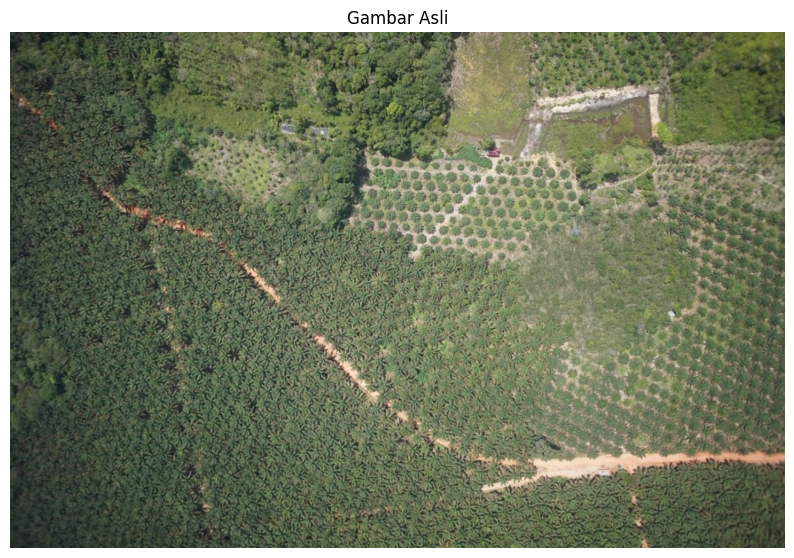

Prediksi untuk gambar crop ke-1:


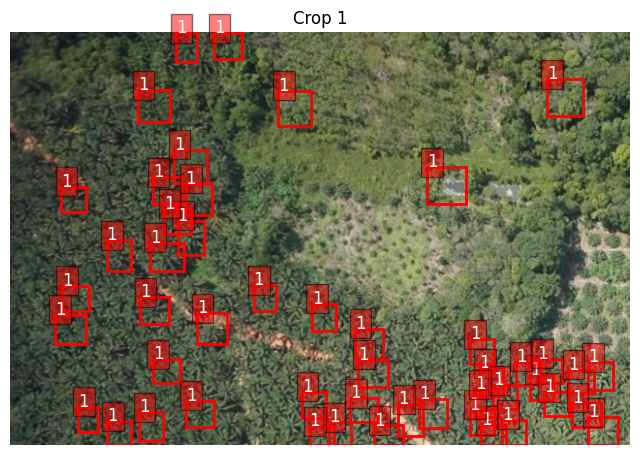

Jumlah label pada crop 1: 49
Prediksi untuk gambar crop ke-2:


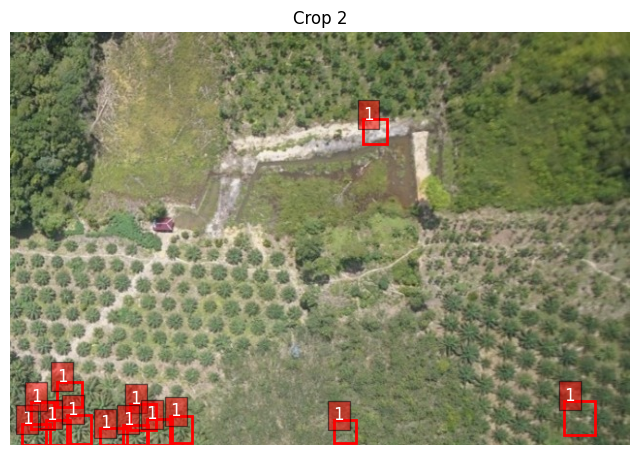

Jumlah label pada crop 2: 13
Prediksi untuk gambar crop ke-3:


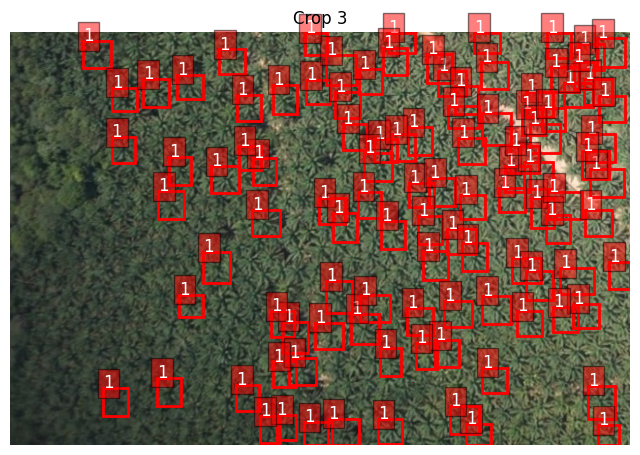

Jumlah label pada crop 3: 104
Prediksi untuk gambar crop ke-4:


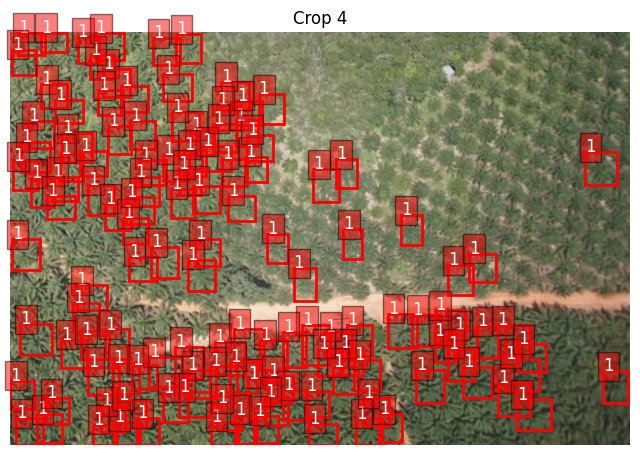

Jumlah label pada crop 4: 127
Jumlah total label dari keempat crop gambar: 293


In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Pastikan model sudah dimuat dan berada dalam mode eval
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_40.pt'))  # Memuat model yang sudah dilatih
model.to(device)

def plot_image_with_boxes(image, boxes, labels, title="Predicted Image"):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, str(label.item()), fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.title(title)
    plt.axis('off')
    plt.show()

def predict_on_image(image, model, device, threshold=0.01):
    transform = transforms.ToTensor()
    image_tensor = transform(image).unsqueeze(0).to(device)  # Mengubah menjadi tensor dan menambah dimensi batch

    # Melakukan prediksi
    model.eval()
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    pred_labels = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())
                pred_labels.append(pred[idx]['labels'][i].cpu().numpy())

    return pred_boxes, pred_labels

# Memuat gambar baru
img_path = '/content/sawit7.jpeg'
image = Image.open(img_path).convert("RGB")

# Menampilkan gambar asli
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.title("Gambar Asli")
plt.axis('off')
plt.show()

# Mendapatkan dimensi gambar
width, height = image.size

# Membagi gambar menjadi 4 bagian
crop_areas = [
    (0, 0, width // 2, height // 2),  # Kiri atas
    (width // 2, 0, width, height // 2),  # Kanan atas
    (0, height // 2, width // 2, height),  # Kiri bawah
    (width // 2, height // 2, width, height)  # Kanan bawah
]

total_labels = 0  # Variabel untuk menghitung jumlah total label

for i, crop_area in enumerate(crop_areas, 1):
    cropped_image = image.crop(crop_area)  # Crop gambar
    pred_boxes, pred_labels = predict_on_image(cropped_image, model, device)

    # Menampilkan gambar hasil crop beserta prediksinya
    print(f"Prediksi untuk gambar crop ke-{i}:")
    plot_image_with_boxes(cropped_image, pred_boxes, pred_labels, title=f"Crop {i}")

    # Menampilkan jumlah label pada crop gambar
    print(f"Jumlah label pada crop {i}: {len(pred_labels)}")

    # Mengakumulasi jumlah label dari semua crop
    total_labels += len(pred_labels)

# Menampilkan jumlah total label dari 4 gambar crop
print(f"Jumlah total label dari keempat crop gambar: {total_labels}")
